In [1]:
#Conectamos nuestro entorno para acceder a nuestro fichero en el drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
#Importamos las librerias necesarias al analysis de nuestro dataset y a la creacion de nuestro modelo de prediccion
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings 
import itertools
import matplotlib
import matplotlib.dates as md
warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')

import statsmodels.api as sm 
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble import IsolationForest
from sklearn.svm import OneClassSVM
from mpl_toolkits.mplot3d import Axes3D

matplotlib.rcParams['axes.labelsize'] = 14
matplotlib.rcParams['xtick.labelsize'] = 14
matplotlib.rcParams['ytick.labelsize'] = 14
matplotlib.rcParams['text.color'] = 'k'

In [3]:
#Leemos y configuramos nuestro dataset 
path= "/content/drive/MyDrive/Colab Notebooks/DATOS_COMPLETOS.CSV"
Df = pd.read_csv(path, delimiter=";", parse_dates=['DateObserved'])

In [4]:
#Imprimimos las 5 primeras filas de nuestro dataset
Df.head()

,Id,Machine,DateStr,DateObserved,H,V,C
0,921880,Batidora,01/09/2018 13:39:16,2018-09-01 13:39:16,0.18,0.14,0.1
1,921881,Batidora,01/09/2018 13:39:46,2018-09-01 13:39:46,0.17,0.15,0.1
2,921882,Batidora,01/09/2018 13:40:15,2018-09-01 13:40:15,0.17,0.17,0.1
3,921883,Batidora,01/09/2018 13:42:56,2018-09-01 13:42:56,0.17,0.16,0.1
4,921884,Batidora,01/09/2018 13:43:26,2018-09-01 13:43:26,0.17,0.19,0.1


In [5]:
#Guardamos las columnas que nos interesan 
batidora = Df.loc[Df['Machine'] == 'Batidora']
cols = ['Id','DateStr','Machine']
batidora.drop(cols, axis=1, inplace=True) 
#batidora = batidora.sort_values('DateObserved')
batidora

,DateObserved,H,V,C
0,2018-09-01 13:39:16,0.18,0.14,0.1
1,2018-09-01 13:39:46,0.17,0.15,0.1
2,2018-09-01 13:40:15,0.17,0.17,0.1
3,2018-09-01 13:42:56,0.17,0.16,0.1
4,2018-09-01 13:43:26,0.17,0.19,0.1
...,...,...,...,...
700621,2019-04-30 12:28:48,0.22,0.21,0.1
700622,2019-04-30 12:29:16,0.25,0.23,0.1
700623,2019-04-30 12:29:45,0.24,0.22,0.1
700624,2019-04-30 12:30:13,0.23,0.23,0.1


In [6]:
#Verificamos la presencia de valores nullos en nuestro dataset
batidora.isnull().sum()

DateObserved     0
H               28
V                0
C                7
dtype: int64

POdemos observar que hay 28 valores nullos en la columna que representa la vibracion horizontal y 7 el la columna que representa el corriente. 

In [7]:
#Definimos un subset que regroupa los datos con un intervalo de 15 minutos
batidora = batidora.set_index('DateObserved')
batidoraresample15m = batidora.resample('15 min').mean()
batidoraresample15m['H'].fillna(batidoraresample15m['H'].min(),inplace=True)
batidoraresample15m['V'].fillna(batidoraresample15m['V'].min(),inplace=True)
batidoraresample15m['C'].fillna(batidoraresample15m['C'].min(),inplace=True)
batidoraresample15m.head()

,H,V,C
DateObserved,,,
2018-09-01 13:30:00,0.177500,0.166250,0.100000
2018-09-01 13:45:00,0.181667,0.169000,0.100000
2018-09-01 14:00:00,0.183871,0.166452,0.100323
2018-09-01 14:15:00,0.190323,0.170968,0.102581
2018-09-01 14:30:00,0.195806,0.183871,0.100000


In [8]:
#Ploteamos nuestro subset creado anteriormente
fig = px.line(batidoraresample15m, y = ["H","V","C"])
fig.show()

Podemos observar una actividad alternativa del corriente con picos y momentos de parada que podrian ser aparentados a pausas de la batidora o cuando esta apagada. Luego tambien podemos observar una cierta evolucion de los dos tipos de corriente haciendo un zoom vemos que la durante los periodos de bajada de intensidad del corriente hay mas vibraciones horizontales que verticales pero en el caso de intensidad alta del corriente hay as vibraciones verticales. La libreria plotly express nos permite ganar tiempo porque ya podemos analizar todas la variables en un mismo tiempo. No hay que hacer un grafico proprio con los datos que no se veian bien de la base. 

In [9]:
#Esta vez definimos un subset que regroupa los datos con un intervalo de 5 minutos
batidoraresample5m = batidora.resample('5 min').mean()
batidoraresample5m['H'].fillna(batidoraresample5m['H'].min(),inplace=True)
batidoraresample5m['V'].fillna(batidoraresample5m['V'].min(),inplace=True)
batidoraresample5m['C'].fillna(batidoraresample5m['C'].min(),inplace=True)
batidoraresample5m.head()

,H,V,C
DateObserved,,,
2018-09-01 13:35:00,0.175000,0.145000,0.1
2018-09-01 13:40:00,0.178333,0.173333,0.1
2018-09-01 13:45:00,0.185000,0.162000,0.1
2018-09-01 13:50:00,0.178000,0.174000,0.1
2018-09-01 13:55:00,0.182000,0.171000,0.1


In [10]:
#Ploteamos nuestro subset creado anteriormente
fig = px.line(batidoraresample5m, y = ["H","V","C"])
fig.show()

El siguiente grafico nos enseña la evoluciones de los parametros estudiado de la batidora con datos de intervalo de 5 minutos. En comparacion con el primer grafico con datos de intervalo de 15 minutos podemos observar el mismo comportamiento con mas datos. Nos confirma tambien los tiempos fuertes y debiles del corriente y como influa sobre los diferentes tipos de vibracion.

In [11]:
#Take usefull features and strandarize them
outliers_fraction = 0.01
data = batidoraresample15m[["H","V","C"]]

#Train Isolation forest
model  = IsolationForest(contamination = outliers_fraction, n_estimators= 1000, max_features = 1.0, bootstrap= False, n_jobs= -1, random_state = 42, verbose=1)
model.fit(data)
iso_predictions = model.predict(data)
iso_score = model.score_samples(data)

#Guardamos cada predicciones con su score en una lista
batidoraresample15m['anomaly2'] = iso_predictions.tolist()
batidoraresample15m['distance2'] = iso_score.tolist()
batidoraresample15m['anomaly2'] = batidoraresample15m['anomaly2'].map( {1: 0, -1:1} )



[Parallel(n_jobs=2)]: Using backend ThreadingBackend with 2 concurrent workers.
[Parallel(n_jobs=2)]: Done   2 out of   2 | elapsed:    4.3s remaining:    0.0s
[Parallel(n_jobs=2)]: Done   2 out of   2 | elapsed:    4.3s finished


In [12]:
#Contamos los valores nullos en las predicciones que hemos definido como anomalias
batidoraresample15m['anomaly2'].value_counts()

0    22901
1      232
Name: anomaly2, dtype: int64

In [19]:
#print of the Five first value of our anomaly predictions
batidoraresample15m['anomaly2'].head()

DateObserved
2018-09-01 13:30:00    0
2018-09-01 13:45:00    0
2018-09-01 14:00:00    0
2018-09-01 14:15:00    0
2018-09-01 14:30:00    0
Freq: 15T, Name: anomaly2, dtype: int64

In [13]:
#Definemos los diferentes niveles de anomalias que hay 
batidoraresample15m['probability2'] = batidoraresample15m['distance2'].abs()*100
batidoraresample15m['level2'] = 'low'
batidoraresample15m['level2'] = np.where((batidoraresample15m['probability2']>=50)&(batidoraresample15m['anomaly2']== 1),'medium','low')
batidoraresample15m['level2'] = np.where((batidoraresample15m['probability2']>=60)&(batidoraresample15m['anomaly2']== 1),'high',batidoraresample15m['level2'] )
batidoraresample15m['level2'] = np.where((batidoraresample15m['probability2']>=75)&(batidoraresample15m['anomaly2']== 1),'critical', batidoraresample15m['level2'])
batidoraresample15m['level2'].value_counts()

low         22901
high          185
critical       47
Name: level2, dtype: int64

Podemos ver que hay 47 sobre 23133 datos anormales en condicion critico. Lo que aparantemos las verdaderas anomalias. 

In [14]:
#Imprimemos las 5 primeras filas de nuestro subset
batidoraresample15m.head()

,H,V,C,anomaly2,distance2,probability2,level2
DateObserved,,,,,,,
2018-09-01 13:30:00,0.177500,0.166250,0.100000,0,-0.375132,37.513236,low
2018-09-01 13:45:00,0.181667,0.169000,0.100000,0,-0.373387,37.338710,low
2018-09-01 14:00:00,0.183871,0.166452,0.100323,0,-0.378695,37.869479,low
2018-09-01 14:15:00,0.190323,0.170968,0.102581,0,-0.393741,39.374150,low
2018-09-01 14:30:00,0.195806,0.183871,0.100000,0,-0.365489,36.548875,low


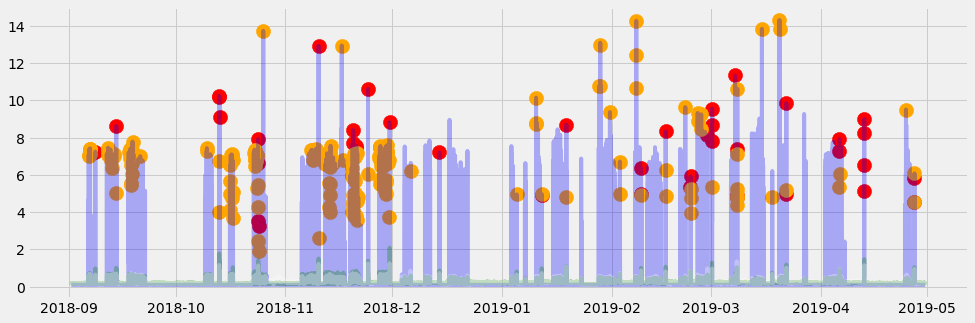

In [20]:
#Ploteamos nuestro dataset con las anomalias (corriente)
fig, ax = plt.subplots(figsize=(15,5))
resultado = batidoraresample15m[['H','V','C','anomaly2','level2']]
resultado['DateObserved'] = batidoraresample15m.index
criticas = resultado.loc[(resultado['anomaly2']==1) & (resultado['level2']=='critical')]
altas = resultado.loc[(resultado['anomaly2']==1) & (resultado['level2']=='high')]
ax.scatter(criticas['DateObserved'],criticas['C'], color='red', s=200)
ax.scatter(altas['DateObserved'],altas['C'], color='orange', s=200)
ax.plot(resultado['DateObserved'],resultado['C'], color='blue', alpha=0.3)
ax.plot(resultado['DateObserved'],resultado['H'], color='green', alpha=0.3)
ax.plot(resultado['DateObserved'],resultado['V'], color='white', alpha=0.3)
plt.show()

Aqui podemos observar la evolucion de nuestro de la batidora a travez de la recepcion de los datos con un intervalo de 15min y donde aparecen las anomalias dicho en nivel criticas y de alto nivel.En este caso se trata de las anomalias detectado al nivel del corriente de la batidora. Los puntos rojos nos indican las anomalias que nos alarman de la condicion de la batidora. Es sinonimo de un comportamiento anormal de la batidora. Los puntos de color naranja son considerados como puntos dudosos que aun pueden ser acceptados pero que necesitan un seguimiento. 

In [23]:
#Ploteamos nuestro subset con las anomalias ( vibraciones )
import plotly.graph_objects as go 
fig = go.Figure()
fig.add_trace(go.Scatter(x=batidoraresample15m.index, y = batidoraresample15m['H'], mode='lines', name='lines'))
fig.add_trace(go.Scatter(x=batidoraresample15m.index, y = batidoraresample15m['V'], mode='lines', name='lines'))
fig.add_trace(go.Scatter(x=criticas.index, y = criticas['H'], mode='markers', name='markers'))
fig.show()

En este caso podemos observar las anomalias detectados al nivel de las vibraciones generadas por la batidora. Podemos ver las anomalias de vibracion en condición criticas. 

In [25]:
#Guardo el fichero bajo un pickle
import pickle 
filename = 'isolation_forest.pickle'
pickle.dump(model, open(filename,'wb'))

In [26]:
#Definemos nuestra funcion de prediccion
def predecir(model,datos):
  df = pd.DataFrame(datos)
  df = df.set_index('DateObserved')
  iso_prediction = model.predict(df)
  iso_score = model.score_samples(df)
  anomaly = (iso_prediction[0]==-1)
  probability = iso_score[0]*100*-1*anomaly
  f'anomaly {anomaly} probabilidad {probability}'
  return anomaly,probability


In [28]:
#Probamos con unos datos entrados manualmente
from datetime import datetime
from datetime import date
now = datetime.now()
today = date.today()
nuevo_dato = {'DateObserved':[now],'H':[1], 'V':[1], 'C':[111]}
predecir(model,nuevo_dato)

(True, 80.05999284740292)

In [29]:
filename = 'isolation_forest.pickle'
model1 = pickle.load(open(filename,'rb'))
predecir(model1,nuevo_dato)

(True, 80.05999284740292)

CONCLUSION

Las anomalías detectadas en la tendencia de la corriente pueden deberse a una sobrecarga de la batería. Esta sobrecarga de la batería provocaría una inversión de las vibraciones que normalmente deberían ser horizontales y que, en caso de alta intensidad de corriente, se convierten en verticales (de ahí las anomalías observadas en las vibraciones).